# Rasters in different projections

## Mapping in R: From Reading in Shape files and Rasters to plotting Shape files alongside Rasters in different Projections.

In this section we learn how to deal with polygons that cross the dateline (0° wrapping back onto 360°) or the anti-meridian (-180° folding back onto +180°). There are three major steps we will take in this section:

1. Create background map
2. Add spatially explicit details
3. Improve appearance

### Creating background maps

Sometimes this is all we want in maps. We can create various types of background maps such as: satellite image, coastline maps, road map. Generally, it gives us the spatial context for other elements we want to display on the map.

### Spatially ecplicit details

We want the elements we are going to display inside our geographical context. This could be bathymetry, sample sites, labels etc.

### Appearance

Finally, we want to add other info elements like scale bars, north arrows, data sources and generally improve the appearance.

### **Map the globe**
#### Step 1: Create background map

All we nned for this section is the data itself, then we want to plot it in a projection that makes sense for out use. Atlantic centric? Pacific centric? But depending on some projections, we may need to do some extra work for it to look really nice.

Often times we will have our own shape or raster files locally, but there are also a wide range of easily accessible data for different forms of data. In this secion, we will be using readily available open acess data, specifically the `{rnaturalearth}` shapefiles of countries for starters.

The `{rnaturalearth}` packages have preloaded data that we can access for country polygons at different spatial scales, lets look at the middle scale. If we load the basic `ne_countries()` data set and tell the function we want it as an **sf object**, we can plot it using the base plot. However, since there are many columns other than the spatial information the base `plot()` function plots each separately.

In [86]:
options(
  repr.plot.width  = 9,
  repr.plot.height = 6,
  repr.plot.res    = 200
)

# These options center our plots and gives them a better resolution than default.

In [3]:
library(tidyverse) 
library(sf) 
library(rnaturalearth) 
library(rnaturalearthdata) 
#remotes::install_github("ropensci/rnaturalearthhires")
library(rnaturalearthhires)

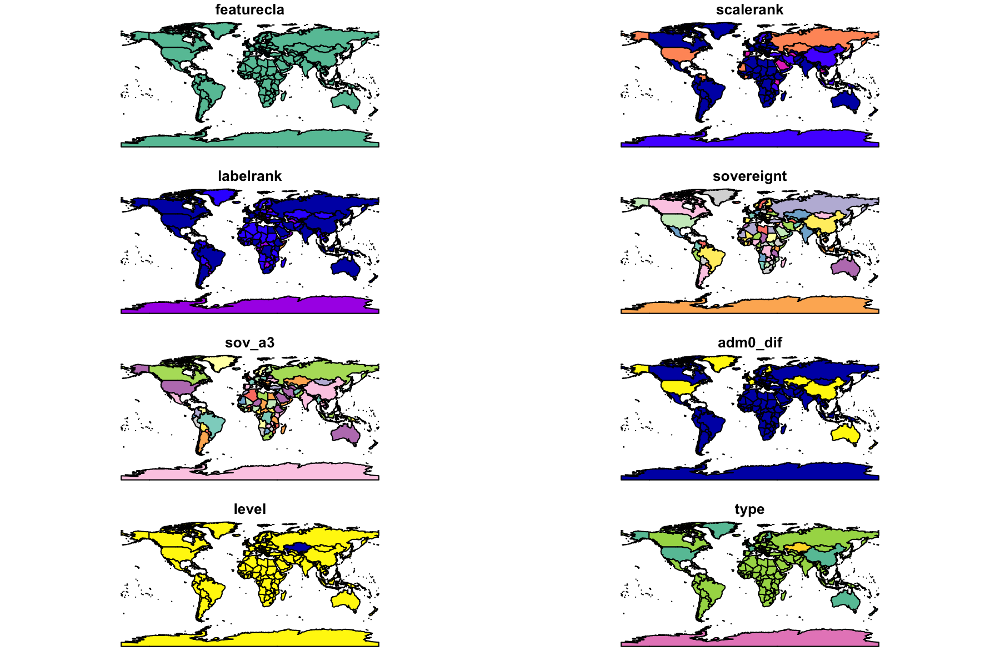

In [4]:
world_map <- ne_countries(returnclass = "sf", scale = 50) 

plot(world_map, max.plot = 8)

The figure above shows world_map objects in our global environment, and generally it seems just like a normal dataframe, with columns and rows of data. 

Lets take a glance at the top of the first 6 columns:

In [5]:
head(world_map[c(1:6)])

Registered S3 method overwritten by 'geojsonsf':
  method        from   
  print.geojson geojson



,featurecla,scalerank,labelrank,sovereignt,sov_a3,adm0_dif,geometry
,<chr>,<int>,<int>,<chr>,<chr>,<int>,<MULTIPOLYGON [°]>
1,Admin-0 country,1,3,Zimbabwe,ZWE,0,MULTIPOLYGON (((31.28789 -2...
2,Admin-0 country,1,3,Zambia,ZMB,0,MULTIPOLYGON (((30.39609 -1...
3,Admin-0 country,1,3,Yemen,YEM,0,MULTIPOLYGON (((53.08564 16...
4,Admin-0 country,3,2,Vietnam,VNM,0,MULTIPOLYGON (((104.064 10....
5,Admin-0 country,5,3,Venezuela,VEN,0,MULTIPOLYGON (((-60.82119 9...
6,Admin-0 country,6,6,Vatican,VAT,0,MULTIPOLYGON (((12.43916 41...


Lets plot it using `ggplot()` instead. The `{sf}` package has its own geom (`geom_sf()`), this means we don’t have to give it too much information for it to do something pretty good.

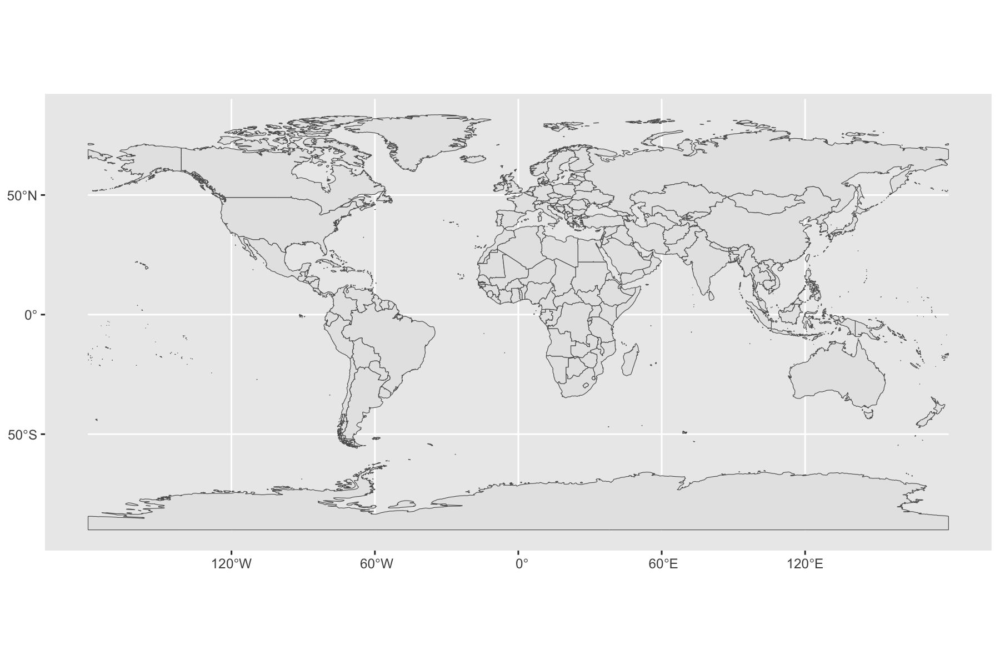

In [6]:
ggplot(world_map)+
  geom_sf()

There are some obvious issues with this map but generally it is a pretty good starting point.

### **Coordinate Reference Systems (CRS) and Projections**

We are looking at a map of a three dimensional sphere projected onto a flat surface. To do this, we use different map projections, which can lead to ineteresting effects by distorting apparent size, such as Antarctica being long and thin at the base of this map, when in reality it is a circle shape around the south pole. We can easily change CRS using `{sf}` functions. Previously, CRS was denoted with quite an long string, now there are easy to use 4-digit EPSG codes. You can find loads here: https://spatialreference.org/ref/epsg/

Here is the same map reprojected to Mercator:

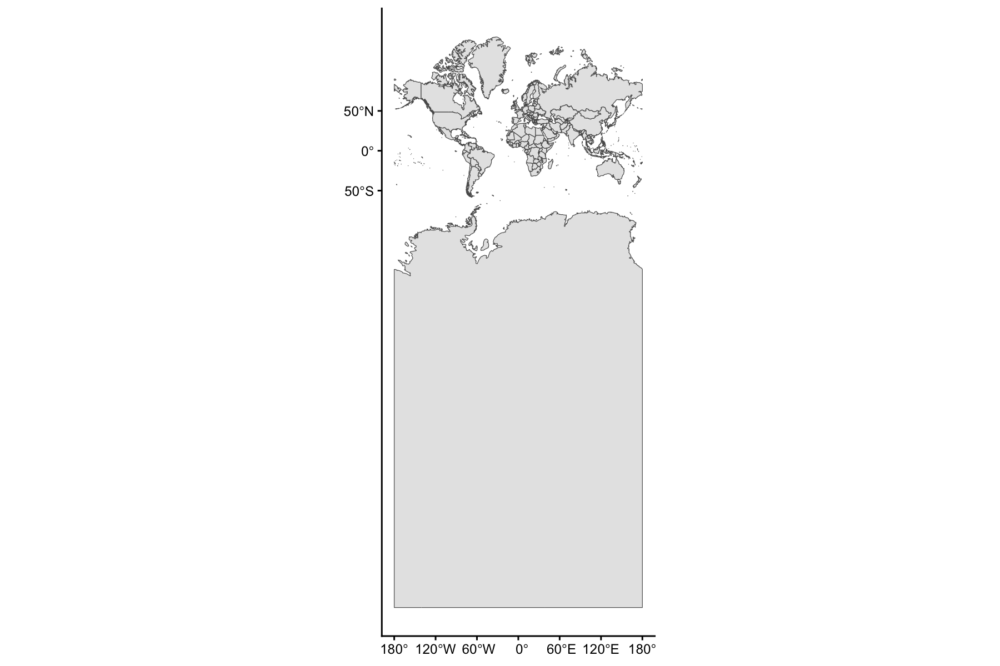

In [7]:
world_map %>%
st_transform(crs = 3857) %>% 
ggplot()+
  geom_sf()+
  theme_classic()

We can see the issue with this projection. It makes greenland look like the size of Africa and it also makes antarctica the size of the sun (not quite)! Since it is in `ggplot()`, we can crop out the bottom of the graph easily.

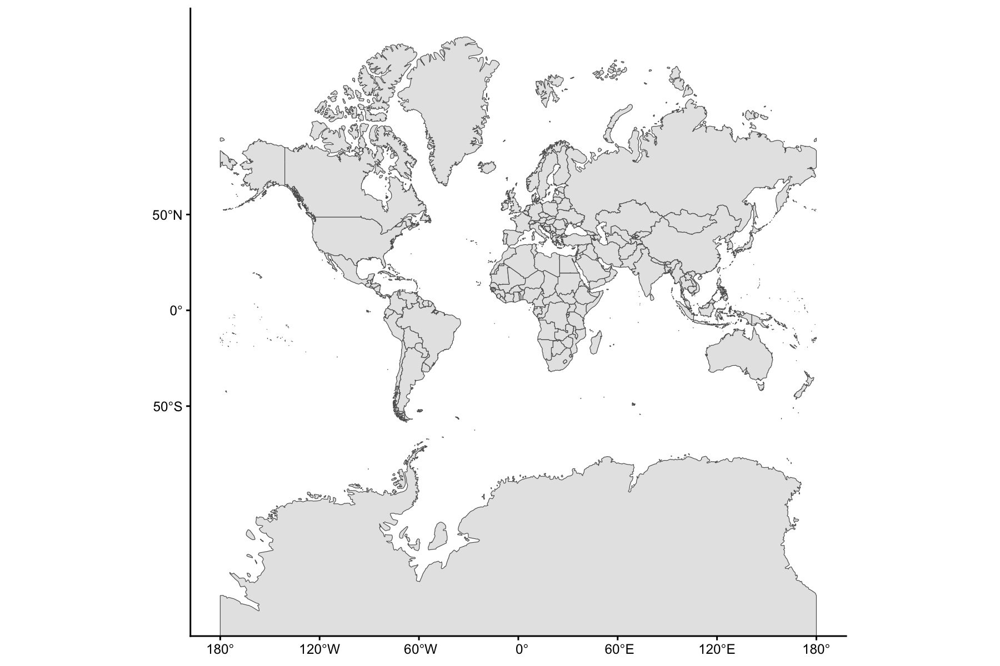

In [8]:
world_map %>%
st_transform(crs=3857) %>% 
ggplot()+
  geom_sf()+
  coord_sf(ylim = c(-20000000, NA))+
  theme_classic()

Mercator uses metres as its units so we have to use those units for setting limits. Lets see some other systems.

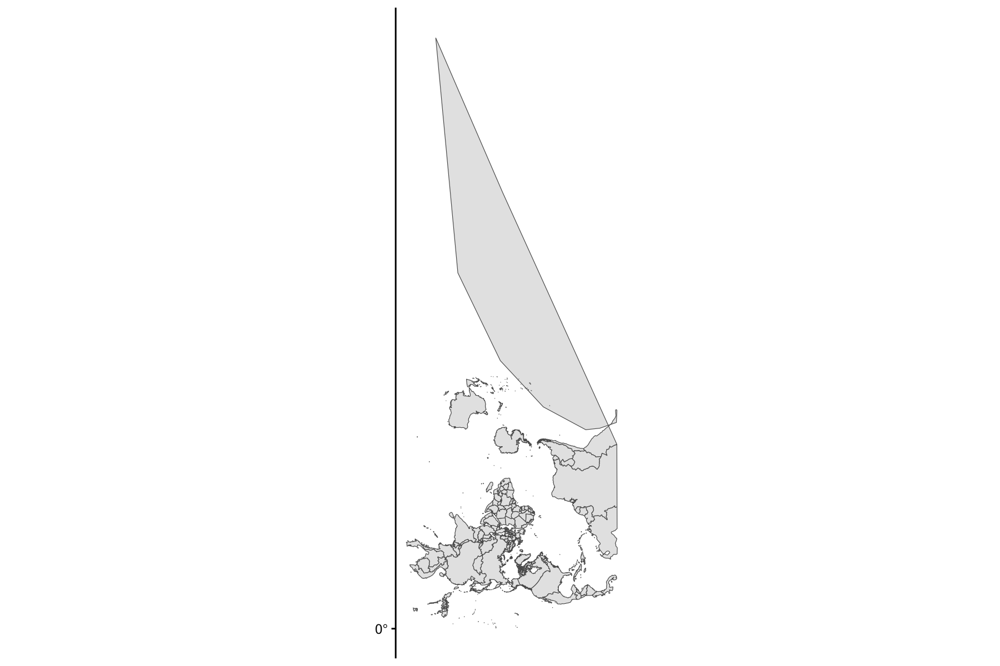

In [9]:
# Hartebeesthoek94 / Lo15
world_map %>%
st_transform(crs = 2046) %>% 
ggplot()+
  geom_sf()+
  theme_classic()

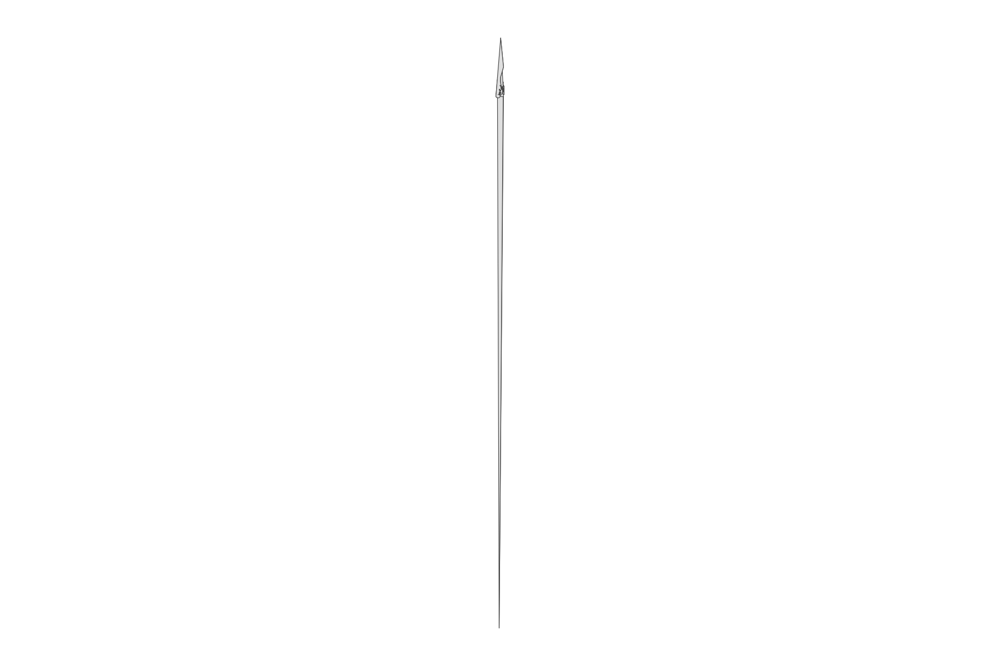

In [10]:
# Montserrat 1958 / British West Indies Grid
world_map %>%
st_transform(crs = 2004) %>% 
ggplot()+
  geom_sf()+
  theme_classic()

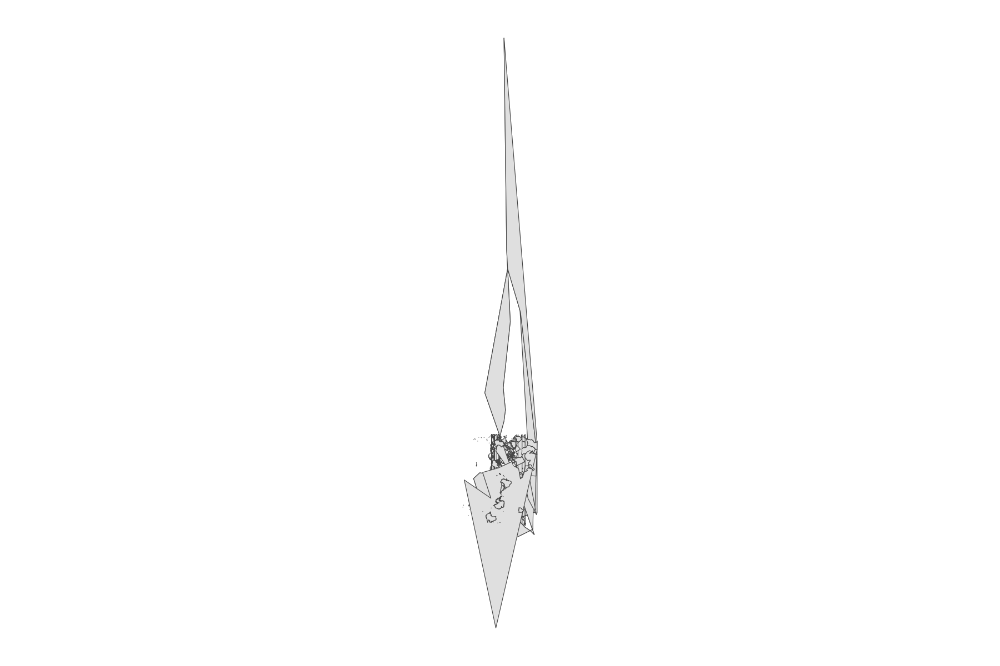

In [11]:
# NAD83 / MTM zone 10
world_map %>%
st_transform(crs = 32190) %>% 
ggplot()+
  geom_sf()+
  theme_classic()

As you can see, all of these projections are terrible. Reprojecting the sf distorts it. If you pay careful attention, you can see that some of the issues are caused mainly by Antarctica. Maybe if we removed it, it would look better.

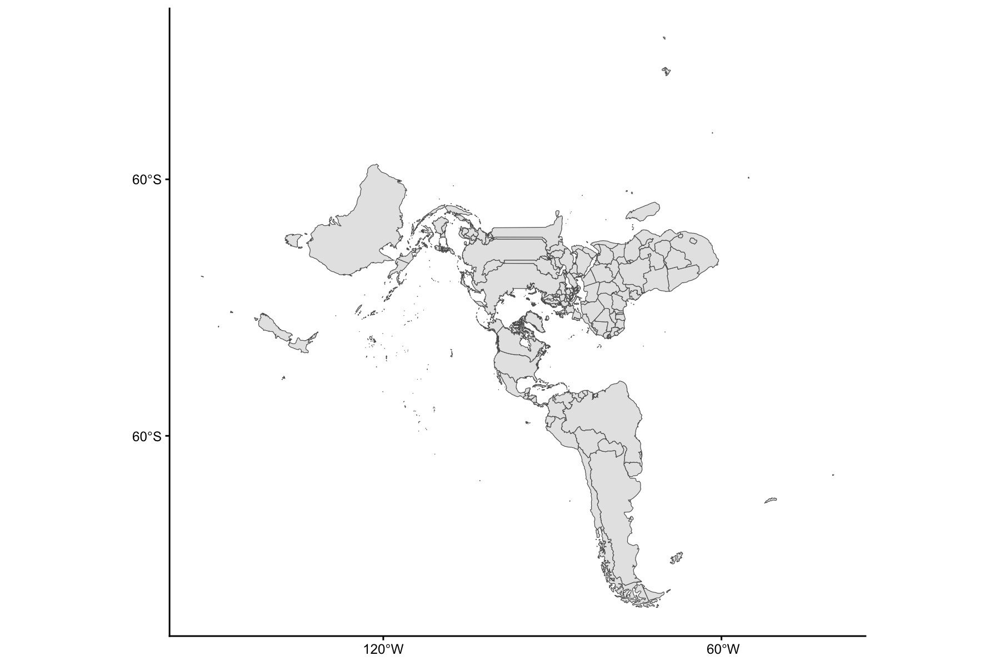

In [12]:
world_map %>%
  filter(!sovereignt == "Antarctica") %>% 
st_transform(crs = 3978) %>% 
ggplot()+
  geom_sf()+
  theme_classic()

Schucks! it did not.

### Distortions

These projections have inherent shapes to theri projection which will be latitude or longitude values, they will also have the centre position. Areas that are furthest from the centre will become distorted when plotting on a 2D plane. There are ways around having these distortions but it involves creating a really thin polygon along the edges of the original map, then deleting this thin polygon. This splits the polygons that will be split when changing the transformation. We can visualise this if we want.

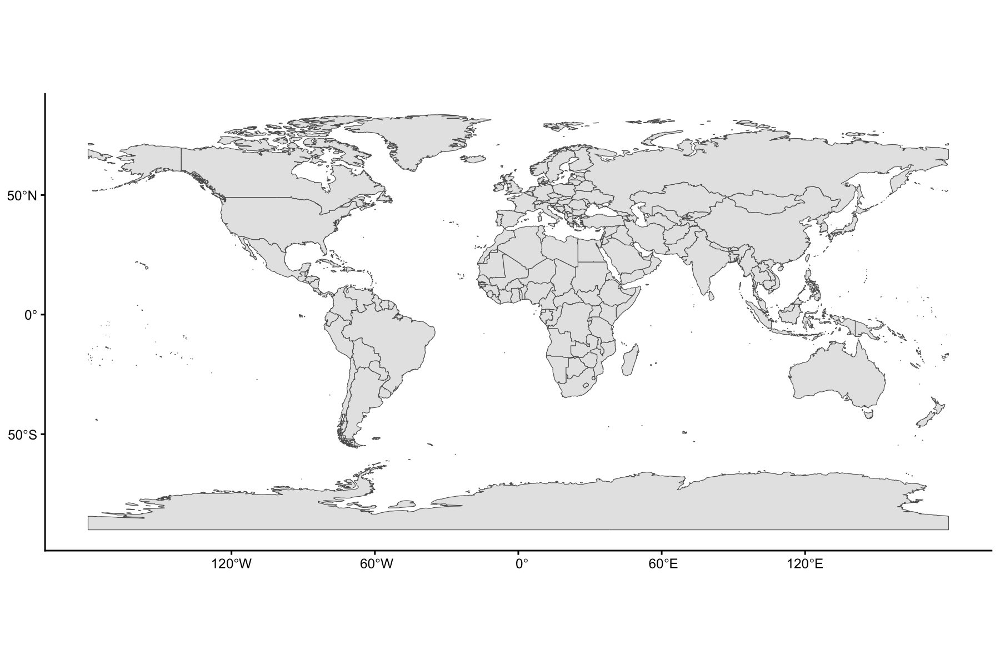

In [13]:
# original world map
world_map %>%
st_transform(crs = 4326) %>% 
ggplot()+
  geom_sf()+
  theme_classic()

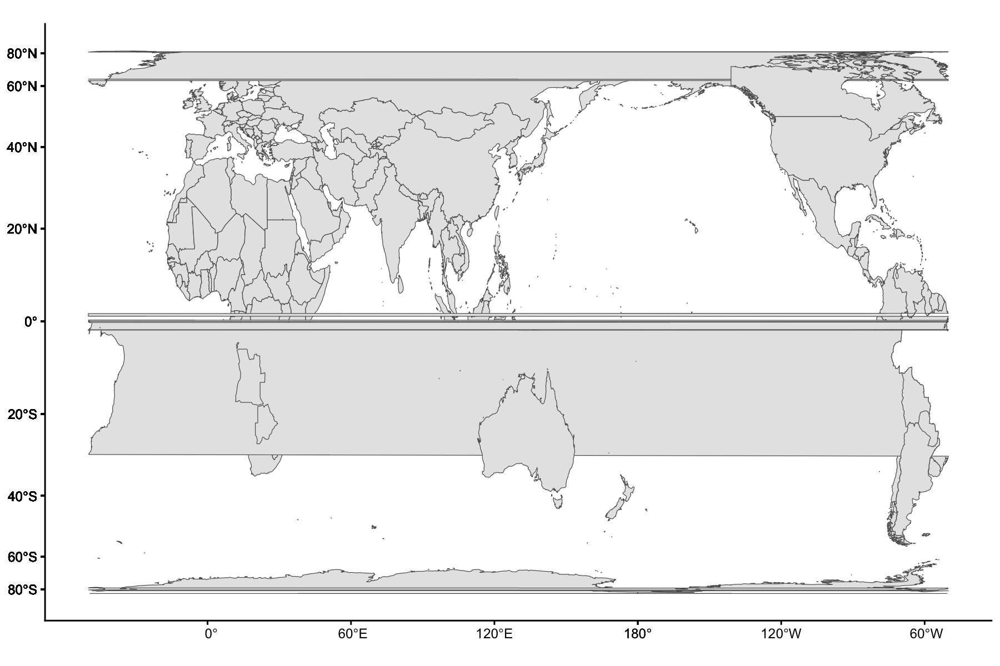

In [15]:
# Transformed into desired CRS
world_map %>%
st_transform(crs = st_crs("+proj=cea +lon_0=130 +x_0=0 +y_0=0 +lat_ts=45 +ellps=WGS84 +datum=WGS84 +units=m +no_defs")) %>% 
ggplot()+
  geom_sf()+
  theme_classic()

In our desired projection, we can see the the central longitude is 130. We therefore need to make a slim polygon opposite 130 on the globe! (180-130)

In [16]:
world <- world_map %>%
st_transform(crs = 4326) %>%
  st_make_valid()


# Define a long & slim polygon that overlaps the meridian line & set its CRS to match that of world
# Centered in lon 130 on this example

offset <- 180 - 130


polygon <- st_polygon(x = list(rbind(
  c(-0.0001 - offset, 90),
  c(0 - offset, 90),
  c(0 - offset, -90),
  c(-0.0001 - offset, -90),
  c(-0.0001 - offset, 90)
))) %>%
  st_sfc() %>%
  st_set_crs(4326)

Plot the slim polygon on the original map.

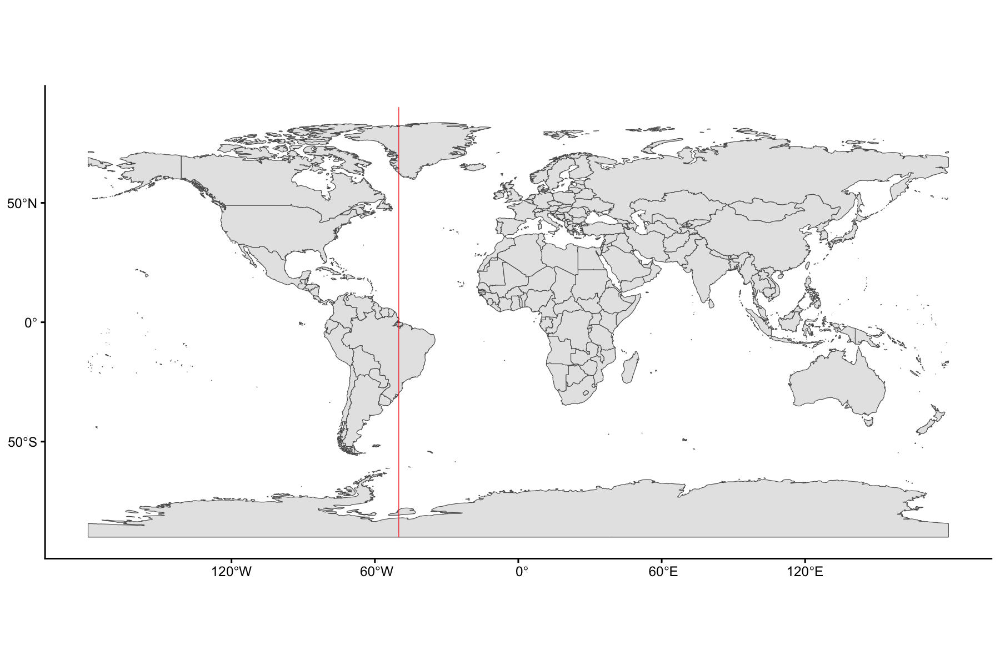

In [17]:
world_map %>%
st_transform(crs = 4326) %>% 
ggplot()+
  geom_sf()+
  geom_sf(data = polygon, fill = "red", colour = "red")+
  theme_classic()

Now that we have this thin polygon, we can remove this slim area from the original world map.

Warning message:
“attribute variables are assumed to be spatially constant throughout all geometries”


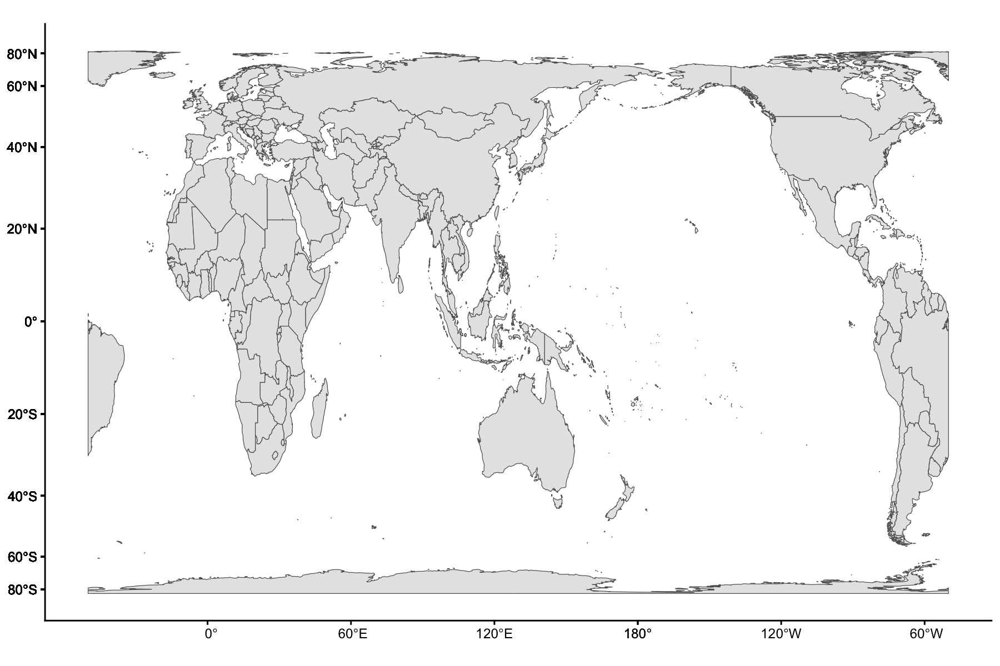

In [18]:
world_fixed <- world %>% 
  st_difference(polygon)

target_crs <- st_crs("+proj=cea +lon_0=130 +x_0=0 +y_0=0 +lat_ts=45 +ellps=WGS84 +datum=WGS84 +units=m +no_defs")

world_fixed <- world_fixed %>% 
  st_transform(target_crs)


ggplot(data = world_fixed) +
  geom_sf()+
  theme_classic()

There are still some odd looking shapes e.g. Papua New Guinea. Maybe we can find a better projection. Maybe we can use one that looks a little 3D even when in 2D?

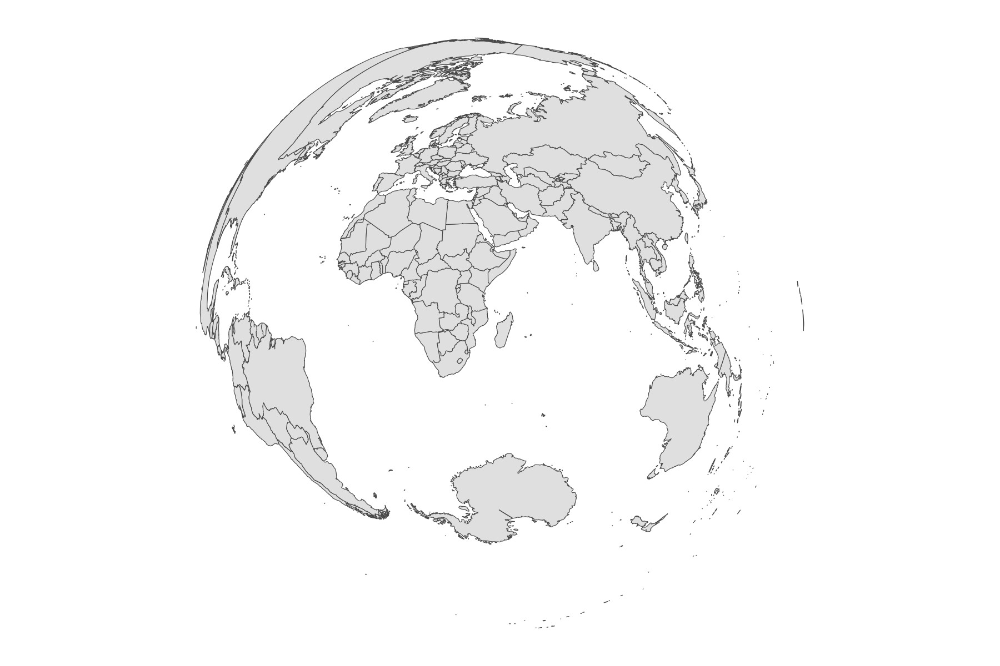

In [19]:
world_map %>% 
  st_transform("+proj=laea +lat_0=-20 +lon_0=45 +x_0=0 +y_0=0 +ellps=WGS84 +units=m +no_defs") %>% 
ggplot()+
  geom_sf()+
  theme_classic()

This projection should be good for mapping East-Africa, I used it above for the map of Africa. The choice of mapping projection will be dictated by the scale you want to show and on your own personal preference.

#### Step 2: Spatially explicit details

Now that we have aglobal map, we will use it as out Base Map. It is not perfect by any means, but it is fine for now. Let us plot some spatially explicit data. Given that majority of the area shown on the Base Map is the ocean, I think a bathymetry plot would be nice, so lets get some bathymetry and try to make a nice bathymetric plot of the waters around Africa. we may have our own bathymetry data, or we could go to some website, download it, and read it into R, or we can download straight into R using the `{marmap}` package. This gets bathymetry data from the NOAA database.


To do this we use the `getNOAA.bathy()` function and tell it the longitude limits, then latitude limits, then the resolution. If our desired data cross the antimeridian (the longitude line 180 and -180) we can tell the function this too. This function creates a bathy object, but we can convert this to a data frame with `as.xyz()`. Remember when we set a big area and a fine resolution value the file gets bigger so will take longer to download and to plot. We shall also remove Depth values that are positive so we only get Depth. (This may not be ideal for inland areas that are below 0, such as the eastern coast of the UK).

In [21]:
#install.packages("marmap")

library(marmap)

Querying NOAA database ...

This may take seconds to minutes, depending on grid size


Building bathy matrix ...



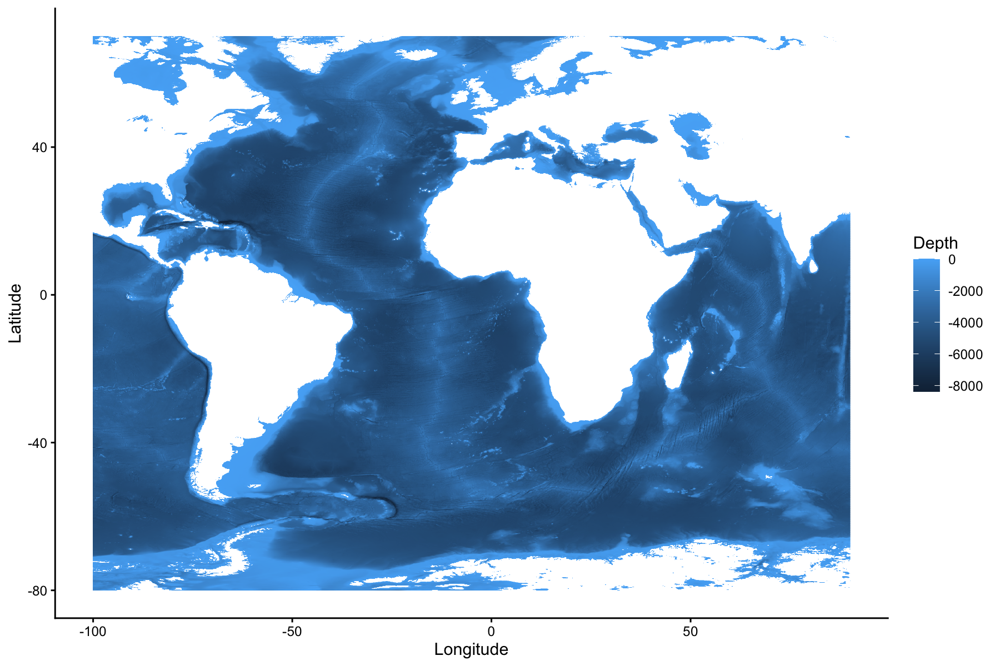

In [22]:
# Get bathymetric data
bat <- getNOAA.bathy(lon1 = -100, lon2 = 90,lat1 = 70,lat2 = -80, res = 4)

bat_xyz <- as.xyz(bat) %>% 
  rename(Longitude = V1, Latitude = V2, Depth = V3) %>% 
  filter(Depth < 1)


ggplot(bat_xyz)+
  geom_tile(aes(x = Longitude, y = Latitude, fill = Depth))+
  theme_classic()

Okay so now we have some regular gridded bathymetry data, but it isn’t the same projection we have our base map in, so if we try plot together it will be rather wrong. Infact on the global scale our bathymetry data which range from -100 to 90 in longitude and 70 to -80 in latitude are not even visible on a map using this projection.

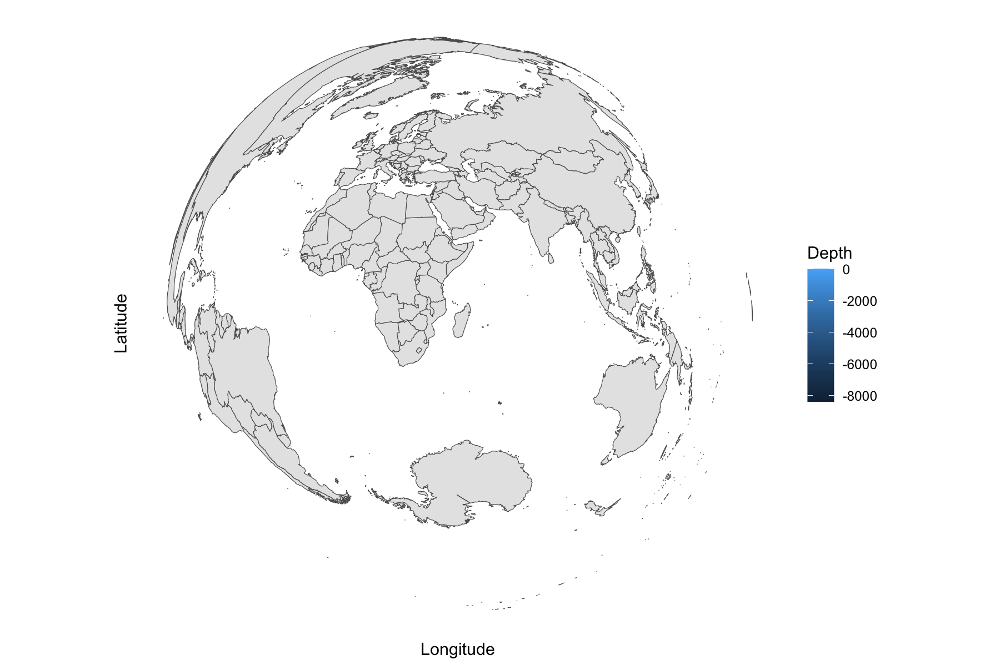

In [23]:
Projection3D <- "+proj=laea +lat_0=-20 +lon_0=45 +x_0=0 +y_0=0 +ellps=WGS84 +units=m +no_defs"

world_map %>% 
  st_transform(Projection3D) %>% 
ggplot()+
  geom_sf()+
  geom_tile(data = bat_xyz, aes(x = Longitude, y = Latitude, fill = Depth))+
  theme_classic()

So what we will do is convert the dataframe to a **spatial object**. We could use `{sf}` to do this. Then we can easily transform it to the projection we want! To do this we can use the `st_as_sf()` function. One issue is that we will need to tell `{sf}` what projection our latitude and longitude data are. Thankfully `getNOAAA.bathy()` uses EPSG:4326.

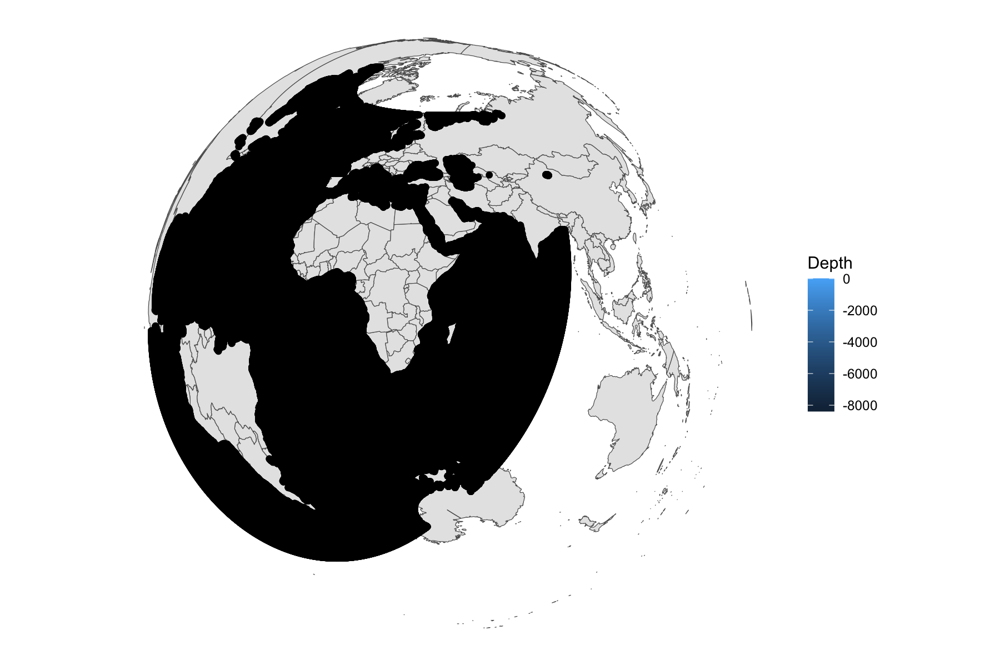

In [24]:
Bathy_sf <- st_as_sf(bat_xyz, coords = c("Longitude", "Latitude"), crs=4326) %>%  
  st_transform(Projection3D)
  

world_map %>% 
  st_transform(Projection3D) %>% 
ggplot()+
  geom_sf()+
  geom_sf(data = Bathy_sf, aes(fill = Depth))+
  theme_classic()

This doesn’t look like it has worked, what is happening is that each row of the sf is thought of as a point, ggplot is then plotting those points. It would be better for speed of plotting and how the plot looks if we use a raster format, as this is how the data are laid out. We can use the terra package to do this.

In [26]:
#install.packages("terra")
#install.packages("tidyterra")

library(terra)
library(tidyterra)

<SpatRaster> resampled to 500619 cells.


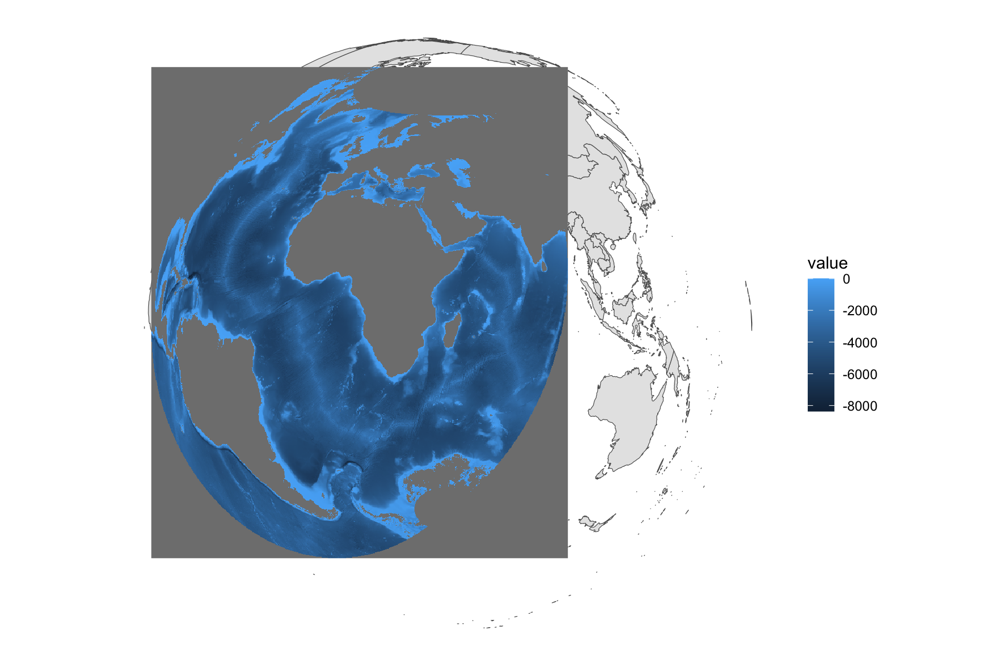

In [27]:
Bathy_terra <- as_spatraster(bat_xyz, xycols = c(1:2), crs = 4326) %>%  
  project(Projection3D)
  

world_map %>% 
  st_transform(Projection3D) %>% 
ggplot()+
  geom_sf()+
  geom_spatraster(data = Bathy_terra, aes(fill = Depth))+
  theme_classic()

Okay, this is good, the projection is correct and the detail is enough for our current zoom level. The main issue now seems to be the NA values in the spat raster being plotted in a grey colour. So lets plot this with a nicer colour palette, and maybe we want our map lines to be on top of the bathymetry?

<SpatRaster> resampled to 500619 cells.


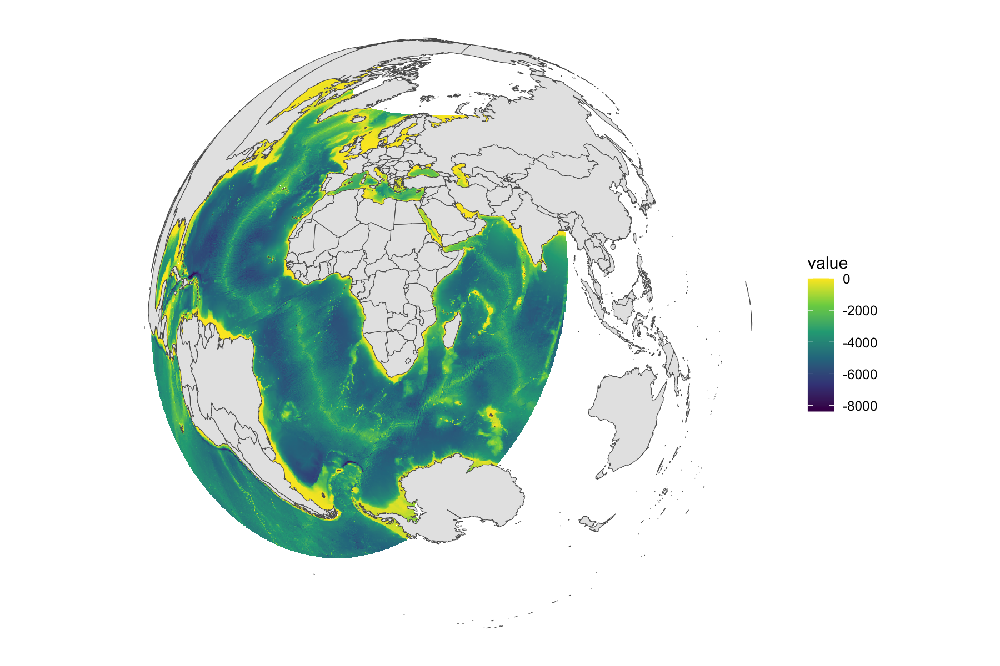

In [28]:
world_map %>% 
  st_transform(Projection3D) %>% 
ggplot()+
  geom_spatraster(data = Bathy_terra, aes(fill = Depth))+
  geom_sf()+
  scale_fill_viridis_c(na.value = NA)+
  theme_classic()

Hmmm maybe it would be nicer with a full global bathymetry? Or we could zoom into the area we have bathymetry for? Or both?

In [29]:
# Hide warnings
options(warn = -1)

Querying NOAA database ...

This may take seconds to minutes, depending on grid size


Building bathy matrix ...

<SpatRaster> resampled to 500484 cells.


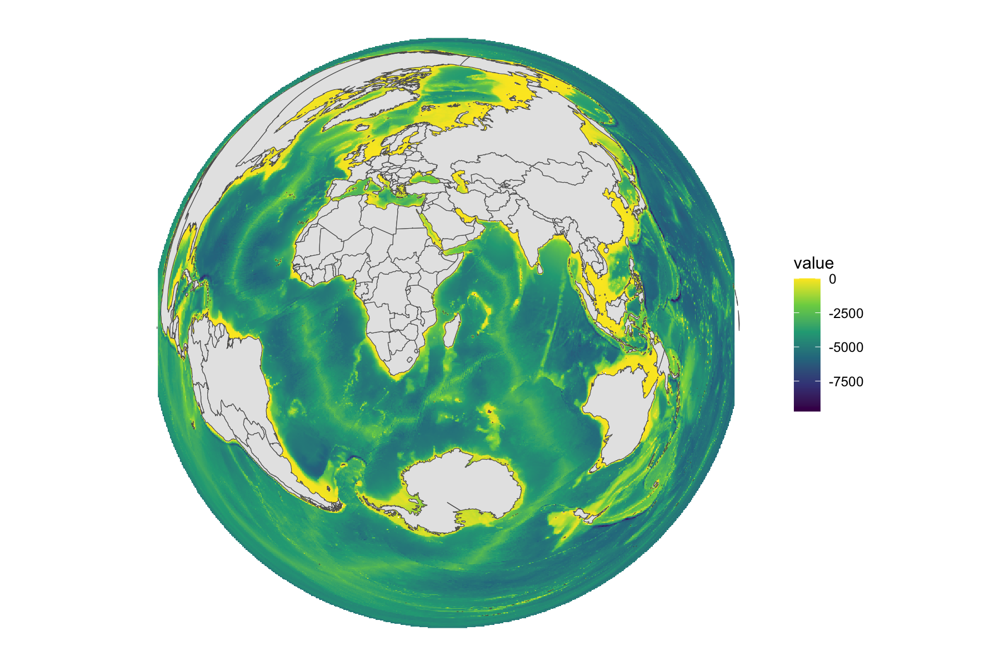

In [30]:
bat_whole <- getNOAA.bathy(lon1 = -180, lon2 = 180, lat1 = 90, lat2 = -90, res = 10)

Bathy_Whole_World <- as.xyz(bat_whole) %>% 
  rename(Longitude = V1, Latitude = V2, Depth = V3) %>% 
  filter(Depth<1) %>% 
  as_spatraster(xycols = c(1:2), crs = 4326) %>%  
  project(Projection3D)

world_map %>% 
  st_transform(Projection3D) %>% 
ggplot()+
  geom_spatraster(data = Bathy_Whole_World, aes(fill = Depth))+
  geom_sf()+
  scale_fill_viridis_c(na.value = NA)+
  theme_classic()

Lets also make some labels of points of interest, and lets zoom in on the eastern part of Africa because it is cool! It is one of the most geologically and biologically unique regions on the planet. This area is defined by a combination of ancient rifts, extreme oceanographic turbulence, and world-leading levels of endemism. 

Since our projection works in metres, it would be a lot of trial and error to get the correct values, but we can create an **sf object** with the latitude and longitude we want then transform it and use that to create our limits! I will just look up some islands and archipelagoes and their Latitudes and Longitudes and add them as labels with the `{ggforce}` package function `geom_mark_ellipse()`.

In [31]:
# install.packages("sfheaders")
# install.packages("ggforce")

library(sfheaders)
library(ggforce)

In [32]:
Crop_MAR <- data.frame(
  lon = c(20, 80, 20, 80),  
  lat = c(-45, -45, 20, 20)
) %>% 
  st_as_sf(coords=c("lon", "lat"), crs = 4326) %>% 
  st_transform(Projection3D) %>% 
  sf_to_df(fill = TRUE)

InterestingPoints <- data.frame(
  lon = c(37.75, 40.36, 43.72, 39.35, 55.47, 57.59, 53.85),  
  lat = c(-46.89, -22.37, -12.31, -6.14, -4.67, -20.29, 12.54),
  Islands= c("Marion Island", "Europa Island", "Comoros Islands", 
             "Zanzibar", "Syechelles", "Mauritius", "Socotra" )
) %>% 
  st_as_sf(coords=c("lon", "lat"), crs = 4326) %>% 
  st_transform(Projection3D) %>% 
  sf_to_df(fill = TRUE)

<SpatRaster> resampled to 500484 cells.


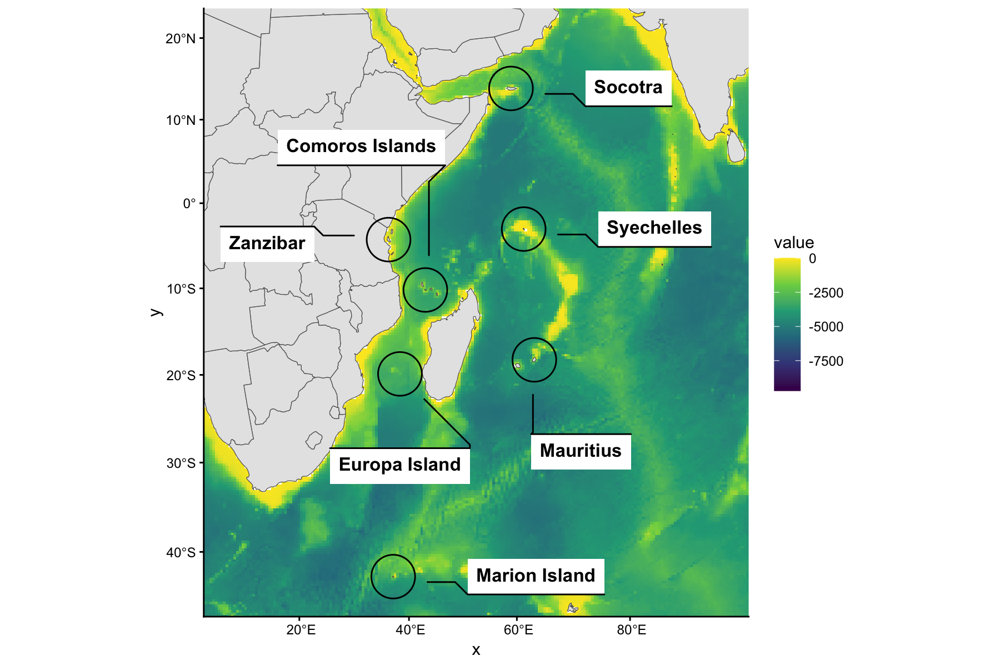

In [33]:
world_map %>% 
  st_transform(Projection3D) %>% 
ggplot()+
  geom_spatraster(data = Bathy_Whole_World, aes(fill = Depth))+
  geom_sf()+
geom_mark_ellipse(data = InterestingPoints,
               aes(x = x,
                   y = y,
                   label = Islands,
                   group = Islands))+
  scale_fill_viridis_c(na.value = NA)+
  coord_sf(xlim = c(min(Crop_MAR$x),max(Crop_MAR$x)),
           ylim = c(min(Crop_MAR$y),max(Crop_MAR$y)))+
  theme_classic()

#### Step 3: Appearence

Honestly appearence is down to your personal preference. For a map this big I think a scale bar is unneccesary and in my opinion a North arrow is never useful (except for navigational maps), as having Latitude on the y axis and Longitude on the x axis removes its utility.

All I will do here is add nicer legend labels. Again it is personal preference but Depth in my opinion should be positive going deeper. I also add a scale bar, although with this projection it will change how big it should be for different areas of the map. I change the colour scheme of the bathymetry to be a blue palette. Then I add Labels for x and y, and a caption of data source. I add some grid lines to show latitude and longitude lines with `theme()`.

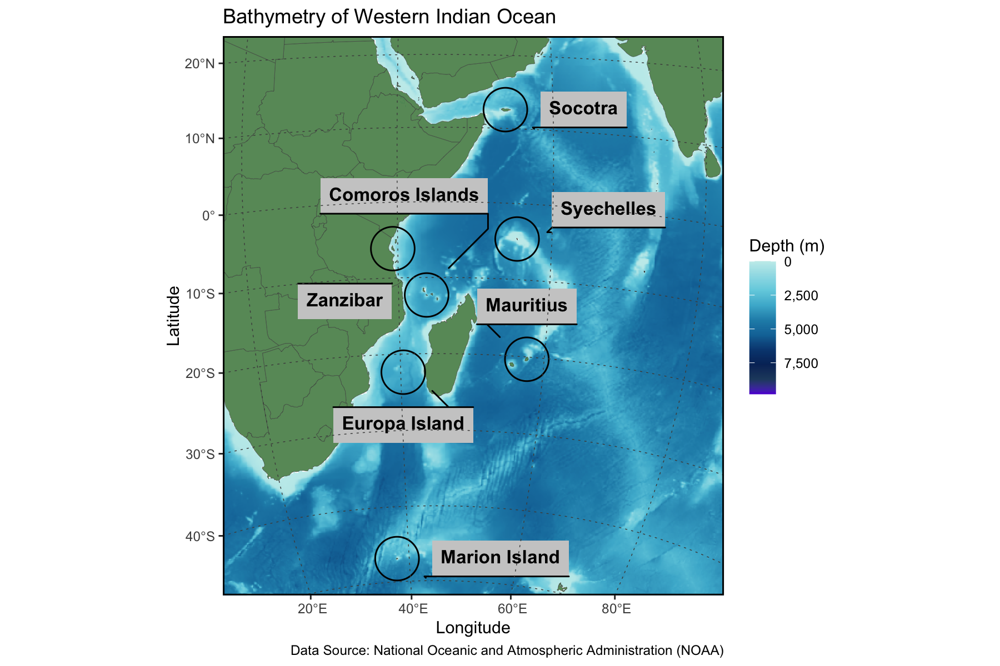

In [87]:
world_map %>% 
  st_transform(Projection3D) %>% 
ggplot()+
  geom_spatraster(data = Bathy_Whole_World, aes(fill = Depth), maxcell = 5005560)+
  geom_sf(linewidth = 0.1, alpha = 0.9,
          fill = "palegreen4", colour = "grey30")+
geom_mark_ellipse(data = InterestingPoints,
               aes(x = x,
                   y = y,
                   label = Islands,
                   group = Islands) ,
               show.legend = F,
               alpha = 0.8,
               label.buffer = unit(1, "mm"),
               label.fill = "grey80")+
  scale_fill_gradientn(colours = c("#5e24d6", "#22496d", "#042f66", "#054780", "#1074a6",
                                "#218eb7", "#48b5d2", "#72d0e1", "#9ddee7", "#c6edec"),
                       breaks = c(0, -2500, -5000, -7500),
                       labels = c("0", "2,500", "5,000", "7,500"),
                       na.value = NA)+
  coord_sf(xlim = c(min(Crop_MAR$x),max(Crop_MAR$x)),
           ylim = c(min(Crop_MAR$y),max(Crop_MAR$y)))+
  labs(x = "Longitude", y = "Latitude", 
       caption = "Data Source: National Oceanic and Atmospheric Administration (NOAA)",
       title = "Bathymetry of Western Indian Ocean", fill = "Depth (m)")+
  theme(panel.background = element_blank(), # bg of the panel
    panel.grid.major = element_line(linetype = "dotted",
                                             colour="grey30",
                                             linewidth=0.25),
    panel.ontop = TRUE,
    panel.grid.minor = element_blank(),
    panel.border = element_rect(colour = "black", fill = NA, linewidth = 1))

### Make an even more complex map

To make an even more WOW map, we will zoom in to two regions of the map and plot them with patchwork to try and make a nice plot.

First we save our base map. Then create a zoom in of Europa Island, Marion Island and Comoros Isalnds. We will download higher resolution imagery and world maps for these so they don't look pixelated. Note we set the limits of the fill scale to be the same for each so the same palette is used for each.

In [45]:
world_map_HighRes <- ne_countries(returnclass = "sf", scale = 10) 

bat_whole_Comoros <- getNOAA.bathy(lon1 = 40, lon2 = 48, lat1 = -16, lat2 = -8, res = 1)

Bathy_Comoros <- as.xyz(bat_whole_Comoros) %>% 
  rename(Longitude = V1, Latitude = V2, Depth = V3) %>% 
  filter(Depth < 1) %>% 
  as_spatraster(xycols = c(1:2), crs = 4326) %>%  
  project(Projection3D)

bat_whole_Europa <- getNOAA.bathy(lon1 = 37, lon2 = 44, lat1 = -26, lat2 = -18, res = 1)

Bathy_Europa <- as.xyz(bat_whole_Europa) %>% 
  rename(Longitude = V1, Latitude = V2, Depth = V3) %>% 
  filter(Depth < 1) %>% 
  as_spatraster(xycols = c(1:2), crs = 4326) %>%  
  project(Projection3D)

bat_whole_Marion <- getNOAA.bathy(lon1 = 34, lon2 = 42, lat1 = -50, lat2 = -44, res = 1)

Bathy_Marion <- as.xyz(bat_whole_Marion) %>% 
  rename(Longitude = V1, Latitude = V2, Depth = V3) %>% 
  filter(Depth < 1) %>% 
  as_spatraster(xycols = c(1:2), crs = 4326) %>%  
  project(Projection3D)

Querying NOAA database ...

This may take seconds to minutes, depending on grid size


Building bathy matrix ...

Querying NOAA database ...

This may take seconds to minutes, depending on grid size


Building bathy matrix ...

Querying NOAA database ...

This may take seconds to minutes, depending on grid size


Building bathy matrix ...



Now  we just use the same plotting code for each plot to be saved as global objects.

In [80]:
BaseMap <- world_map %>% 
  st_transform(Projection3D) %>% 
ggplot()+
  geom_spatraster(data = Bathy_Whole_World, aes(fill = Depth), maxcell = 5005560)+
  geom_sf(linewidth = 0.1, alpha = 0.9,
          fill = "palegreen4", colour = "grey30")+
geom_mark_ellipse(data = InterestingPoints,
               aes(x = x,
                   y = y,
                   label = Islands,
                   group = Islands) ,
               show.legend = F,
               alpha = 0.8,
  label.fontsize = 10, 
label.buffer = unit(8, "mm"),
label.fill = "grey90")+
  scale_fill_gradientn(colours = c("#5e24d6", "#22496d", "#042f66", "#054780", "#1074a6",
                                   "#218eb7", "#48b5d2", "#72d0e1", "#9ddee7", "#c6edec"),
                       breaks = c(0, -2500, -5000, -7500),
                       labels = c("0", "2,500", "5,000", "7,500"),
                       limits = c(-9000, 0),
                       na.value = NA)+
  coord_sf(xlim = c(min(Crop_MAR$x), max(Crop_MAR$x)),
           ylim = c(min(Crop_MAR$y), max(Crop_MAR$y)))+
  labs(x = "Longitude", y = "Latitude", 
       title = "Bathymetry of Western Indian Ocean", fill = "Depth (m)")+
  theme(panel.background = element_blank(), # bg of the panel
    panel.grid.major = element_line(linetype = "dotted",
                                    colour = "grey30",
                                    linewidth = 0.25),
    panel.ontop = TRUE,
    panel.grid.minor = element_blank(),
    panel.border = element_rect(colour = "black", fill = NA, linewidth = 1))

In [67]:
Comoros <- data.frame(
  lon = c(42, 46, 46, 42),
  lat = c(-14, -14, -10, -10)
) %>% 
  st_as_sf(coords=c("lon", "lat"), crs = 4326) %>% 
  st_transform(Projection3D) %>% 
  sf_to_df(fill = TRUE)


ComorosMap <- world_map_HighRes %>%
  st_transform(Projection3D) %>%
  ggplot() +
  geom_spatraster(data = Bathy_Comoros, aes(fill = Depth), maxcell = 5005560) +
  geom_sf(linewidth = 0.1, alpha = 0.9,
          fill = "palegreen4", colour = "grey30") +
  geom_mark_ellipse(
    data = InterestingPoints %>% filter(Islands == "Comoros Islands"),
    aes(x = x, y = y, label = Islands, group = Islands),
    show.legend = FALSE,
    alpha = 0.8,
    label.fontsize = 10,
    expand   = unit(1,   "mm"),
    radius   = unit(1,   "mm"),
    label.buffer = unit(4, "mm"),
    label.fill = "grey90"
  ) +
  scale_fill_gradientn(
    colours = c("#5e24d6","#22496d","#042f66","#054780","#1074a6",
                "#218eb7","#48b5d2","#72d0e1","#9ddee7","#c6edec"),
    limits = c(-9000, 0),
    breaks = c(0, -2500, -5000, -7500),
    labels = c("0", "2,500", "5,000", "7,500"),
    na.value = NA
  ) +
  coord_sf(
    xlim = c(min(Comoros$x), max(Comoros$x)),
    ylim = c(min(Comoros$y), max(Comoros$y))
  ) +
  labs(x = "Longitude", y = "Latitude", fill = "Depth (m)") +
  theme(
    panel.background = element_blank(),
    panel.grid.major = element_line(linetype = "dotted", colour = "grey30", linewidth = 0.25),
    panel.ontop      = TRUE,
    panel.grid.minor = element_blank(),
    panel.border     = element_rect(colour = "black", fill = NA, linewidth = 1)
  )

In [66]:
Europa <- data.frame(
  lon = c(38, 43, 43, 38),
  lat = c(-25, -25, -20, -20)
) %>% 
  st_as_sf(coords=c("lon", "lat"), crs = 4326) %>% 
  st_transform(Projection3D) %>% 
  sf_to_df(fill = TRUE)


EuropaMap <- world_map_HighRes %>%
  st_transform(Projection3D) %>%
  ggplot() +
  geom_spatraster(data = Bathy_Europa, aes(fill = Depth), maxcell = 5005560) +
  geom_sf(linewidth = 0.1, alpha = 0.9,
          fill = "palegreen4", colour = "grey30") +
  geom_mark_ellipse(
    data = InterestingPoints %>% filter(Islands == "Europa Island"),
    aes(x = x, y = y, label = Islands, group = Islands),
    show.legend = FALSE,
    alpha = 0.8,
    label.fontsize = 10,
    expand   = unit(0.5, "mm"),
    radius   = unit(0.5, "mm"),
    label.buffer = unit(3, "mm"),
    label.fill = "grey90"
  ) +
  scale_fill_gradientn(
    colours = c("#5e24d6","#22496d","#042f66","#054780","#1074a6",
                "#218eb7","#48b5d2","#72d0e1","#9ddee7","#c6edec"),
    limits = c(-9000, 0),
    breaks = c(0, -2500, -5000, -7500),
    labels = c("0", "2,500", "5,000", "7,500"),
    na.value = NA
  ) +
  coord_sf(
    xlim = c(min(Europa$x), max(Europa$x)),
    ylim = c(min(Europa$y), max(Europa$y))
  ) +
  labs(x = "Longitude", y = "Latitude", fill = "Depth (m)") +
  theme(
    panel.background = element_blank(),
    panel.grid.major = element_line(linetype = "dotted", colour = "grey30", linewidth = 0.25),
    panel.ontop      = TRUE,
    panel.grid.minor = element_blank(),
    panel.border     = element_rect(colour = "black", fill = NA, linewidth = 1)
  )

In [65]:
Marion <- data.frame(
  lon = c(35, 41, 41, 35),
  lat = c(-49, -49, -45, -45)
) %>% 
  st_as_sf(coords=c("lon", "lat"), crs = 4326) %>% 
  st_transform(Projection3D) %>% 
  sf_to_df(fill = TRUE)


MarionMap <- world_map_HighRes %>%
  st_transform(Projection3D) %>%
  ggplot() +
  geom_spatraster(data = Bathy_Marion, aes(fill = Depth), maxcell = 5005560) +
  geom_sf(linewidth = 0.1, alpha = 0.9,
          fill = "palegreen4", colour = "grey30") +
  geom_mark_ellipse(
    data = InterestingPoints %>% filter(Islands == "Marion Island"),
    aes(x = x, y = y, label = Islands, group = Islands),
    show.legend = FALSE,
    alpha = 0.8,
    label.fontsize = 10,
    expand   = unit(0.5, "mm"),
    radius   = unit(0.5, "mm"),
    label.buffer = unit(3, "mm"),
    label.fill = "grey90"
  ) +
  scale_fill_gradientn(
    colours = c("#5e24d6","#22496d","#042f66","#054780","#1074a6",
                "#218eb7","#48b5d2","#72d0e1","#9ddee7","#c6edec"),
    limits = c(-9000, 0),
    breaks = c(0, -2500, -5000, -7500),
    labels = c("0", "2,500", "5,000", "7,500"),
    na.value = NA
  ) +
  coord_sf(
    xlim = c(min(Marion$x), max(Marion$x)),
    ylim = c(min(Marion$y), max(Marion$y))
  ) +
  labs(x = "Longitude", y = "Latitude", fill = "Depth (m)") +
  theme(
    panel.background = element_blank(),
    panel.grid.major = element_line(linetype = "dotted", colour = "grey30", linewidth = 0.25),
    panel.ontop      = TRUE,
    panel.grid.minor = element_blank(),
    panel.border     = element_rect(colour = "black", fill = NA, linewidth = 1)
  )

Lets plot them together with `{Patchwork}`

In [51]:
library(patchwork)

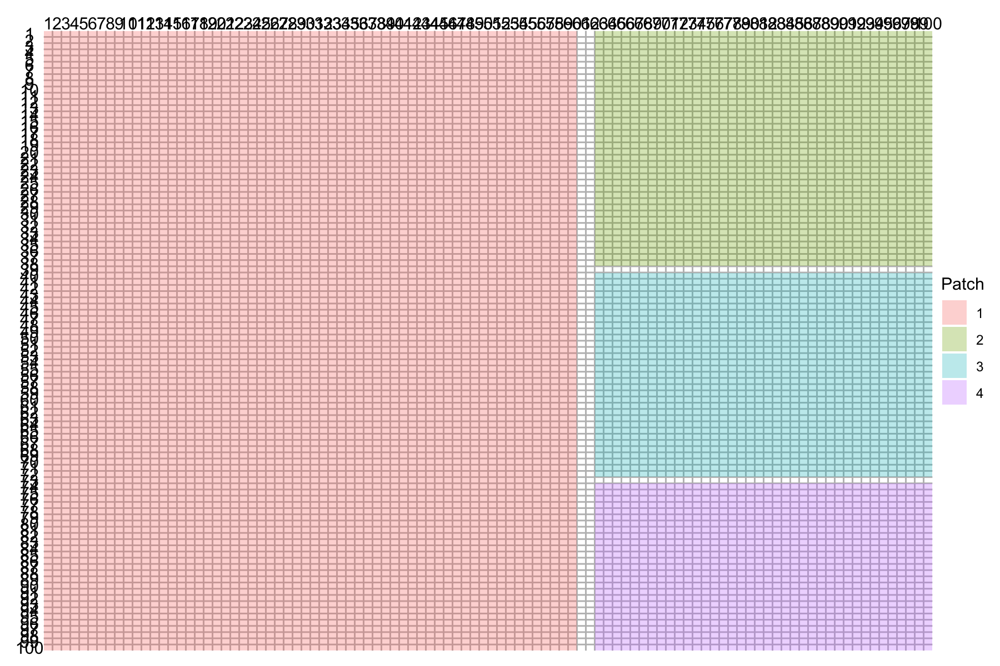

In [77]:
layout <- c(
  patchwork::area(t = 1,  l = 1,  b = 100, r = 60),  # BaseMap - tall and wide
  patchwork::area(t = 1,  l = 63, b = 38,  r = 100), # ComorosMap
  patchwork::area(t = 40, l = 63, b = 72,  r = 100), # MarionMap  
  patchwork::area(t = 74, l = 63, b = 100, r = 100)  # EuropaMap
)

plot(layout)

In [82]:
new_opts <- options(
  repr.plot.width  = 14,
  repr.plot.height = 10,
  repr.plot.res    = 200
)

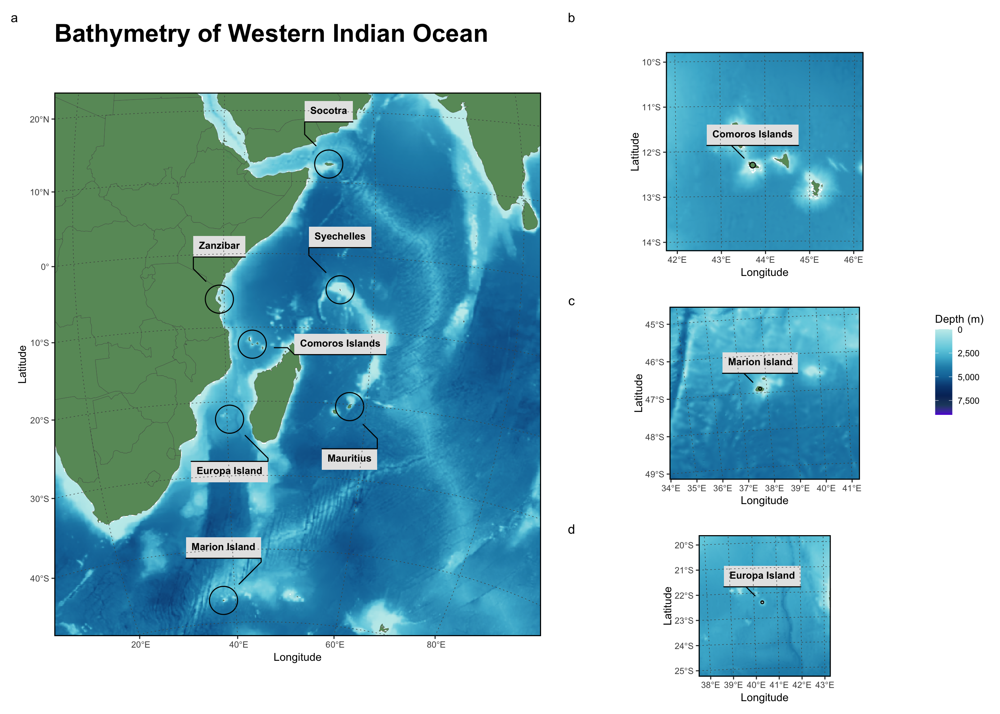

In [83]:
BaseMap + ComorosMap + MarionMap + EuropaMap +
  plot_layout(guides = "collect", design = layout) +
  plot_annotation(tag_levels = "a") &
  theme(plot.title = element_text(face = "bold", size = 25))

options(new_opts)